In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from IPython.display import HTML
from moviepy.editor import VideoFileClip

%matplotlib qt

In [2]:
# Utility functions to extract channels from image

def extract_rgb(img):
    r = img[:, :, 2]
    g = img[:, :, 1]
    b = img[:, :, 0]
    
    return r,g,b

def extract_hsv(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h = hsv[:, :, 0]
    s = hsv[:, :, 1]
    v = hsv[:, :, 2]
    
    return h,s,v

def extract_hls(img):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    h = hls[:, :, 0]
    l = hls[:, :, 1]
    s = hls[:, :, 2]
    
    return h, l, s

def extract_lab(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    l = lab[:,:,0]
    a = lab[:,:,1]
    b = lab[:,:,2]
    
    return l, a, b

In [3]:
# Utility functions for thresholding and extracting lanes

def singlechannel_threshold(img , thresh = (0,255), normalize = False):
    if normalize == True:
        img = img*(255/np.max(img))
    sbinary = np.zeros_like(img)
    sbinary[(img >= thresh[0]) & (img <= thresh[1])] = 1
    return sbinary

def extract_edges(img):
    x1 = singlechannel_threshold((extract_lab(img)[2]) , thresh = (0,200), normalize = True) #detects yellow line
    x2 = singlechannel_threshold((extract_hls(img)[1]) , thresh = (200,255), normalize = True) #detects white line
    x3 = singlechannel_threshold((extract_hls(img))[2] , thresh = (80,200), normalize = True) #detects yellow line
    combined = np.zeros_like(x1)
    combined[(x2 == 1) | ((x1 == 1) & (x3 == 1))] = 1
    return combined*255

In [4]:
# Utility functions

def region_of_interest(img, vertices = np.array([[(0,720),(600,450),(750, 450), (1280,720)]], dtype=np.int32)):
    img_copy = img.copy()
    mask = np.zeros_like(img)
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image = cv2.bitwise_and(img_copy, mask)
    return masked_image


def perspective_transform(img, inv = False):
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32([[312,707],[1131,707],[897,575],[457,575]])
    dst = np.float32([[450,720],[830,720],[830,550],[450,550]])
    
    if inv == False:
        M = cv2.getPerspectiveTransform(src,dst)
    else:
        M = cv2.getPerspectiveTransform(dst,src)
    
    warped = cv2.warpPerspective(img, M, img_size)
    return warped, M

In [5]:
# Utility functions to populate details of the frame

def add_details(img, curverad, offcenterdist):
    h = img.shape[0]
    font = cv2.FONT_HERSHEY_SIMPLEX
    
    text = 'Radius of curvature: ' + '{:04.3f}'.format(curverad) + 'm'
    cv2.putText(img, text, (40,70), font, 1.5, (0,255,0), 2, cv2.LINE_AA)
    
    if offcenterdist >= 0:
        direction = 'right'
    else:
        direction = 'left'
    
    abs_offcenterdist = abs(offcenterdist)
    text = '{:04.2f}'.format(abs_offcenterdist) + 'm ' + direction + ' of center'
    cv2.putText(img, text, (40,120), font, 1.5, (0,255,0), 2, cv2.LINE_AA)
    return img

In [6]:
# Utility function to run pipeline and generate output video

def build_output_video(video_path_prefix):
    output_video_name = '{}_output.mp4'.format(video_path_prefix)
    input_video = VideoFileClip("{}.mp4".format(video_path_prefix))
    pipeline = Pipeline(input_video.get_frame(0))

    output_video = input_video.fl_image(pipeline.run)
    %time output_video.write_videofile(output_video_name, audio=False)

In [7]:
# Class to set up camera calibration

class Camera(object):
    def __init__(self, calibration_images, pattern_shape=(9,6)):
        self.calibrated_images = []
        self.failed_images = []
        self.matrix = None
        self.dist = None
        self.calibrate(calibration_images, pattern_shape)
        
    def __call__(self, image):
        if self.matrix is not None and self.dist is not None:
            return cv2.undistort(image, self.matrix, self.dist, None, self.matrix)
        else:
            return image
        
    def calibrate(self, calibration_images, pattern_shape):
        pattern = np.zeros((pattern_shape[1]*pattern_shape[0], 3), np.float32)
        pattern[:, :2] = np.mgrid[0:pattern_shape[0], 0:pattern_shape[1]].T.reshape(-1, 2)
        
        objpoints = []
        imgpoints = []
        image_size = None
        
        for i, fname in enumerate(calibration_images):
            img = cv2.imread(fname)
            gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
            ret, corners = cv2.findChessboardCorners(gray, pattern_shape, None)
            
            if ret == True:
                objpoints.append(pattern)
                imgpoints.append(corners)
                image_size = (img.shape[1], img.shape[0])
                cv2.drawChessboardCorners(img, pattern_shape, corners, True)
                self.calibrated_images.append(img)
            else:
                self.failed_images.append(img)
                
        if objpoints and imgpoints:
            _, self.matrix, self.dist, _, _ = cv2.calibrateCamera(objpoints, imgpoints, image_size, None, None)

In [8]:
# Class to calculate lane lines

class LaneExtractor(object):    
    def __init__(self, binary_image):
        self.height = binary_image.shape[0]
        self.width = binary_image.shape[1]
        self.left_fit = None
        self.right_fit = None
        self.firstFrame = True
        self.left_curverad = None
        self.left_curverad = None
        self.distancel = None
        self.distancer = None
        
    def find_lane_pixels(self, binary_warped):
        nwindows = 9
        margin = 100
        minpix = 50
        
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

        midpoint = np.int(histogram.shape[0]//2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        window_height = np.int(binary_warped.shape[0]//nwindows)
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        leftx_current = leftx_base
        rightx_current = rightx_base

        left_lane_inds = []
        right_lane_inds = []

        for window in range(nwindows):
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin

            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass

        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        return leftx, lefty, rightx, righty

    def search_around_poly(self, binary_warped):
        margin = 100
        
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        left_lane_inds = ((nonzerox > (self.left_fit[0]*(nonzeroy**2) + self.left_fit[1]*nonzeroy + 
                        self.left_fit[2] - margin)) & (nonzerox < (self.left_fit[0]*(nonzeroy**2) + 
                        self.left_fit[1]*nonzeroy + self.left_fit[2] + margin)))
        right_lane_inds = ((nonzerox > (self.right_fit[0]*(nonzeroy**2) + self.right_fit[1]*nonzeroy + 
                        self.right_fit[2] - margin)) & (nonzerox < (self.right_fit[0]*(nonzeroy**2) + 
                        self.right_fit[1]*nonzeroy + self.right_fit[2] + margin)))
        
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        return leftx, lefty, rightx, righty

    def fit_poly(self, leftx, lefty, rightx, righty):
        try:
            self.left_fit = np.polyfit(lefty, leftx, 2)
            self.right_fit = np.polyfit(righty, rightx, 2)
            self.calculate_radius_and_offcenter(leftx, lefty, rightx, righty)
        except:
            pass
        
        ploty = np.linspace(0, self.height-1, self.height)

        left_fitx = self.left_fit[0]*ploty**2 + self.left_fit[1]*ploty + self.left_fit[2]
        right_fitx = self.right_fit[0]*ploty**2 + self.right_fit[1]*ploty + self.right_fit[2]
        
        return left_fitx, right_fitx, ploty
    
    def calculate_radius_and_offcenter(self, leftx, lefty, rightx, righty):
        ym_per_pix = 20/720
        xm_per_pix = 3.7/380
        
        ploty = np.linspace(0, self.height-1, self.height)
        y_eval = np.max(ploty)
        
        try:
            left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
            right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        except:
            left_fit_cr = (1,1,1)
            right_fit_cr = (1,1,1)
        
        self.left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        self.right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
        self.left_offcentre = np.absolute((self.width // 2 - left_fit_cr[-1]) * xm_per_pix)
        self.right_offcentre = np.absolute((self.width // 2 - right_fit_cr[-1]) * xm_per_pix)
    
    def radius_of_curvature(self):
        return np.int((self.right_curverad + self.left_curverad)/2)
    
    def off_center_distance(self):
        return (self.right_offcentre - self.left_offcentre)/2

    def find_lane(self, binary_warped):
        #if self.firstFrame == True:
        #    l = self.find_lane_pixels(binary_warped)
        #else:
        #    l = self.search_around_poly(binary_warped)
        
        #self.firstFrame = False
        
        l = self.find_lane_pixels(binary_warped)

        left_fitx, right_fitx, ploty = self.fit_poly(l[0], l[1], l[2], l[3])
        
        return left_fitx, right_fitx, ploty

In [9]:
# Class for the lane finding pipeline

class Pipeline(object):
    def __init__(self, first_frame):
        self.height = first_frame.shape[0]
        self.width = first_frame.shape[1]
        self.lanes = None
        self._calibration()
        self._init_lanes(first_frame)
        
    def _init_lanes(self, first_frame):
        image_roi = region_of_interest(first_frame)
        transformed, _ = perspective_transform(image_roi)
        edges = extract_edges(transformed)
        self.lanes = LaneExtractor(edges)
        
    def _calibration(self):
        self.camera_calibration = Camera(glob.glob('camera_cal/calibration*.jpg'), (9,6))
        
    def _lane_overlay(self, warp_frame):
        edges = extract_edges(warp_frame)
        left_fitx, right_fitx, ploty = self.lanes.find_lane(edges)
        warp_path_marker = np.zeros_like(warp_frame)
    
        for n in range(warp_path_marker.shape[0]):
            cv2.line(warp_path_marker, (np.int(left_fitx[n]), np.int(ploty[n])), (np.int(right_fitx[n]), np.int(ploty[n])), (0,255,0), 1)
            cv2.circle(warp_path_marker,  (np.int(left_fitx[n]), np.int(ploty[n])), radius=2, color=(255, 0, 0), thickness=2)
            cv2.circle(warp_path_marker, (np.int(right_fitx[n]), np.int(ploty[n])), radius=2, color=(0, 0, 255), thickness=2)

        path_marker, _ = perspective_transform(warp_path_marker, True)
        return path_marker
        
    def run(self, frame):
        calibrated_frame = self.camera_calibration(frame)
        frame_roi = region_of_interest(frame)
        warp_frame, _ = perspective_transform(frame_roi)
        path_marker = self._lane_overlay(warp_frame)
        output = cv2.addWeighted(calibrated_frame, 1.0, path_marker, 0.4, 0)
        output = add_details(output, self.lanes.radius_of_curvature(), self.lanes.off_center_distance())
        return output  

Text(0.5,1,'Calibrated')

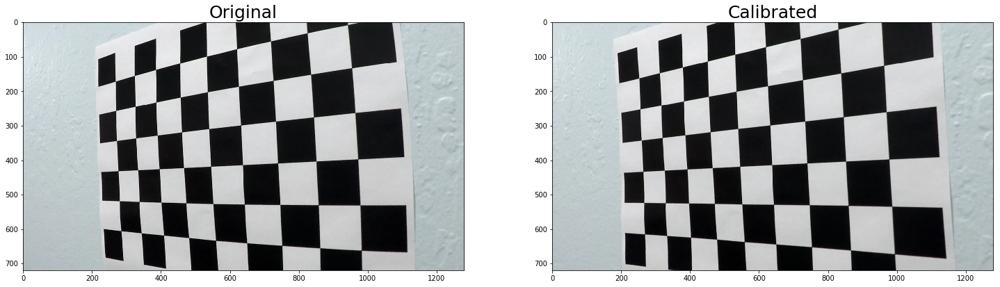

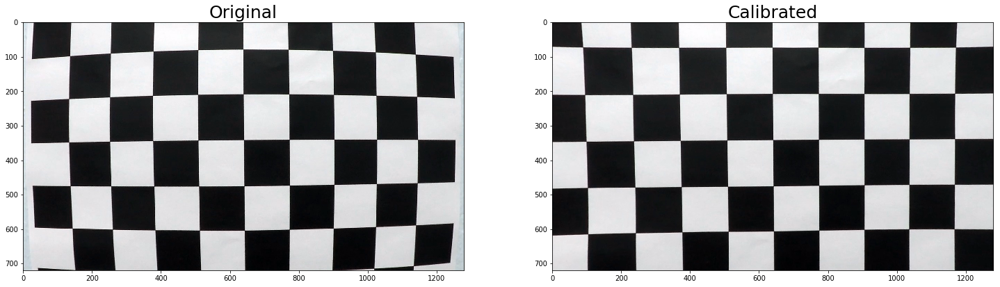

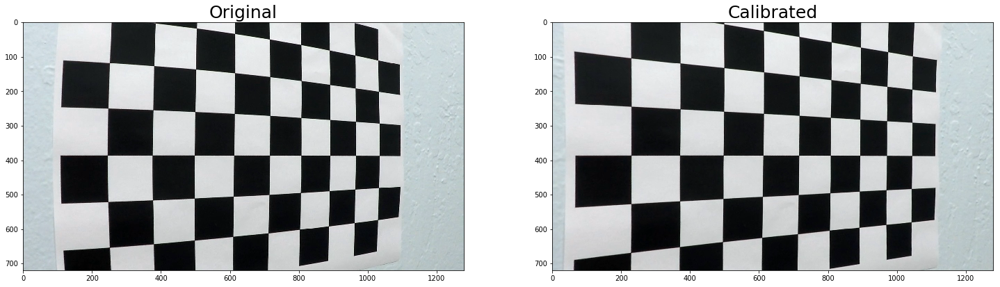

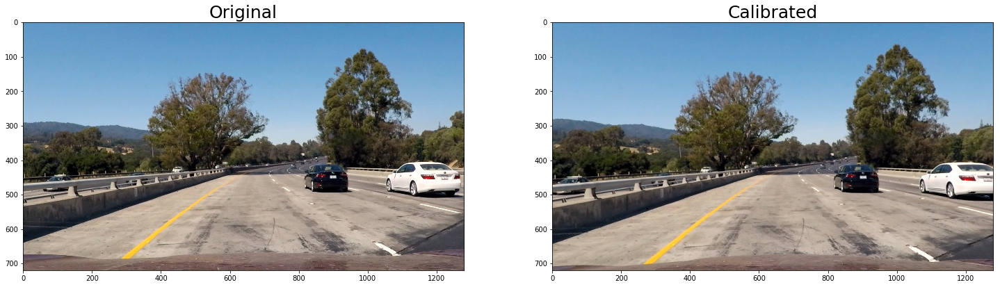

In [10]:
# Showing camera calibration and calibrated outputs and saving 1 instance

calibrated_camera = Camera(glob.glob('camera_cal/calibration*.jpg'), (9,6))

image = calibrated_camera.failed_images[0]
plt.imsave('output_images/calibration_chessboard_original.jpg', image)
plt.imsave('output_images/calibration_chessboard_calibrated.jpg', calibrated_camera(image))
    
for image in calibrated_camera.failed_images:
    f, (img1, img2) = plt.subplots(1, 2, figsize=(25, 10))
    
    img1.imshow(image)
    img1.set_title('Original', fontsize=25)
    
    img2.imshow(calibrated_camera(image))
    img2.set_title('Calibrated', fontsize=25)
    
test_image = plt.imread('test_images/test1.jpg')
plt.imsave('output_images/calibration_original.jpg', test_image)
plt.imsave('output_images/calibration_calibrated.jpg', calibrated_camera(test_image))

f, (img1, img2) = plt.subplots(1, 2, figsize=(25, 10))

img1.imshow(test_image)
img1.set_title('Original', fontsize=25)

img2.imshow(calibrated_camera(test_image))
img2.set_title('Calibrated', fontsize=25)

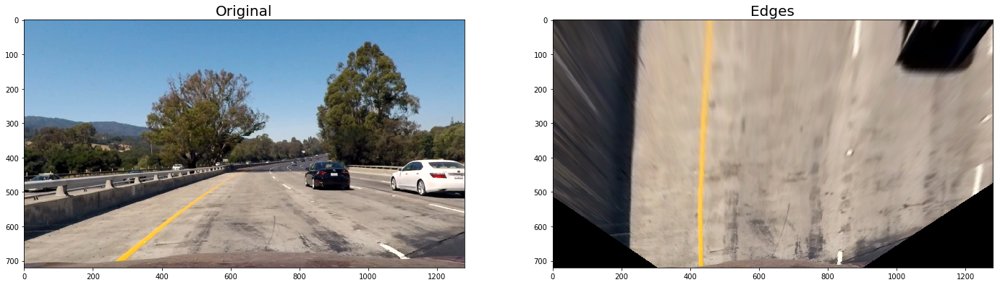

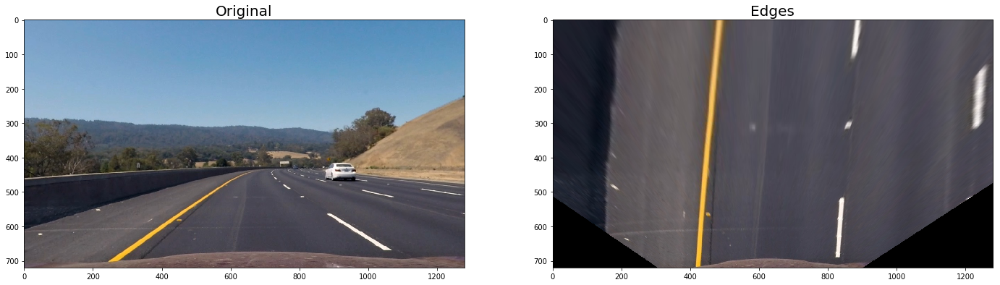

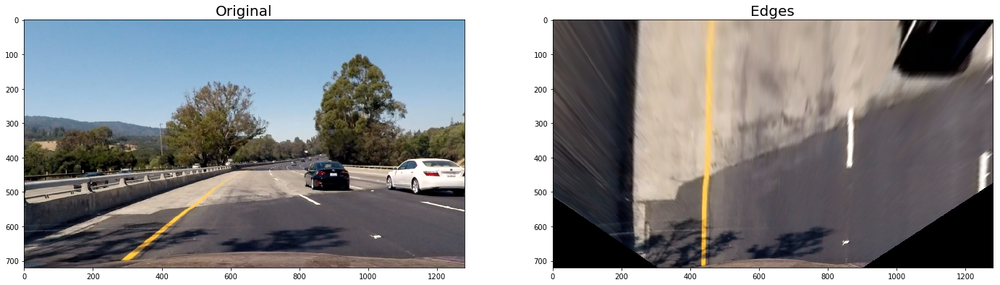

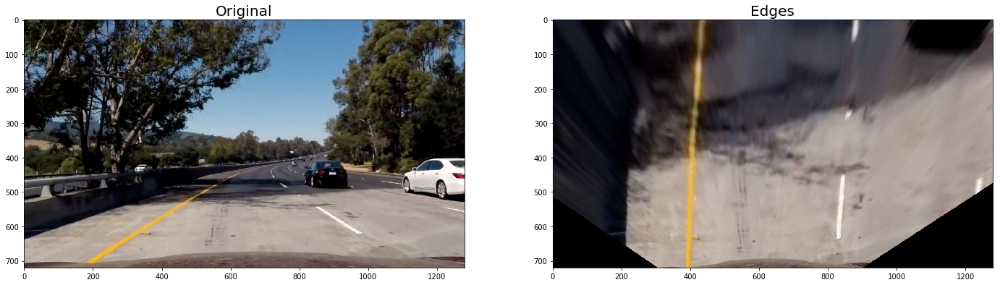

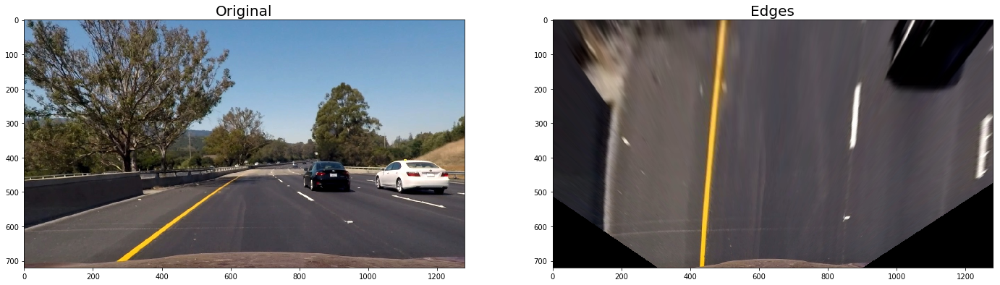

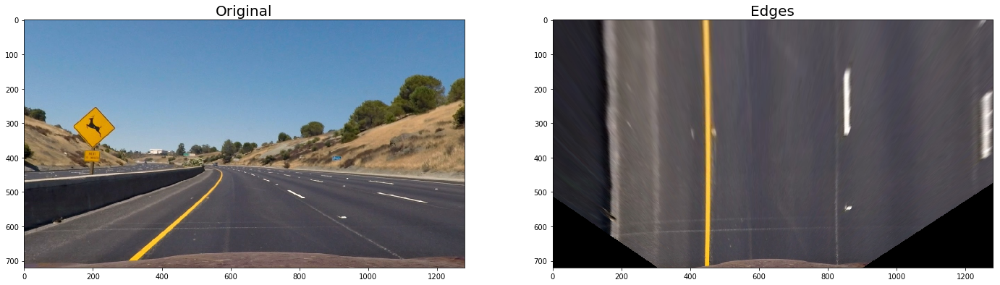

In [11]:
test_image = plt.imread('test_images/test1.jpg')
test_image = calibrated_camera(test_image)
warped_image, _ = perspective_transform(test_image)
plt.imsave('output_images/perspectivetransform_original.jpg', test_image)
plt.imsave('output_images/perspectivetransform_warped.jpg', warped_image)

for image in glob.glob('test_images/test*.jpg'):
    image = plt.imread(image)
    image = calibrated_camera(image)
    warped, _ = perspective_transform(image)

    f, (x1, x2) = plt.subplots(1, 2, figsize=(24, 9))
    
    x1.imshow(image)
    x1.set_title('Original', fontsize=20)

    x2.imshow(warped)
    x2.set_title('Edges', fontsize=20)

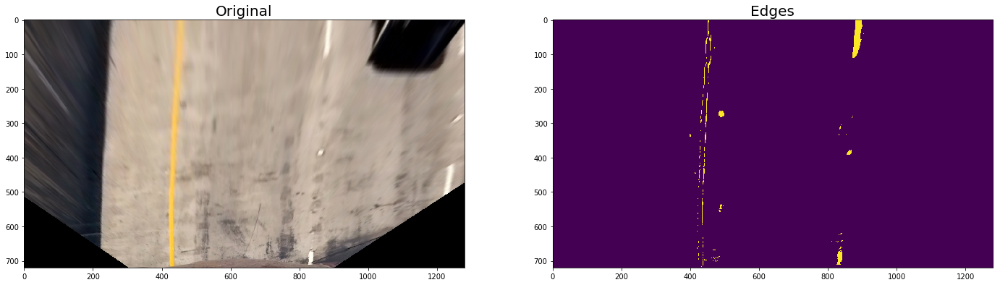

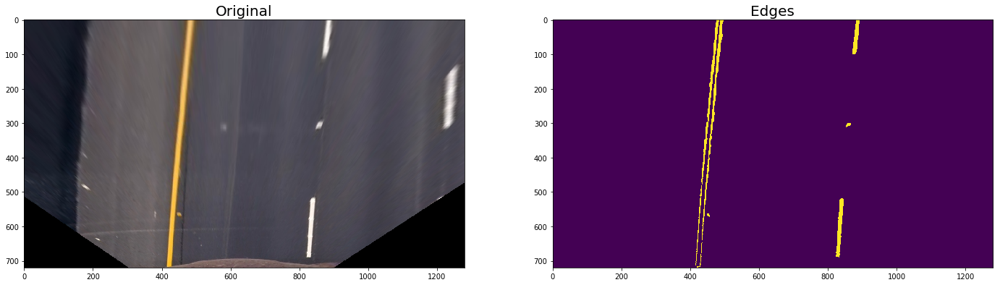

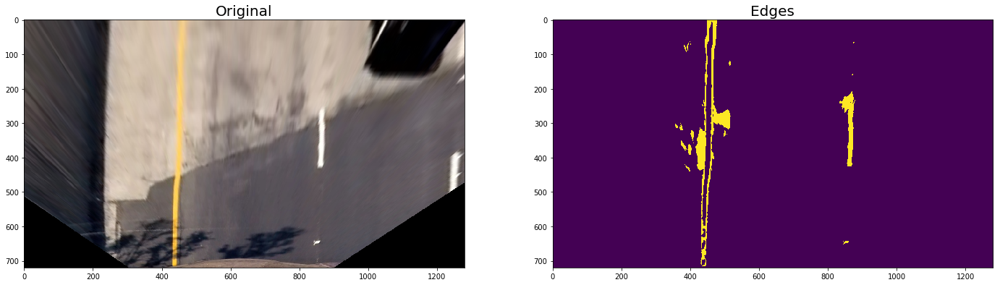

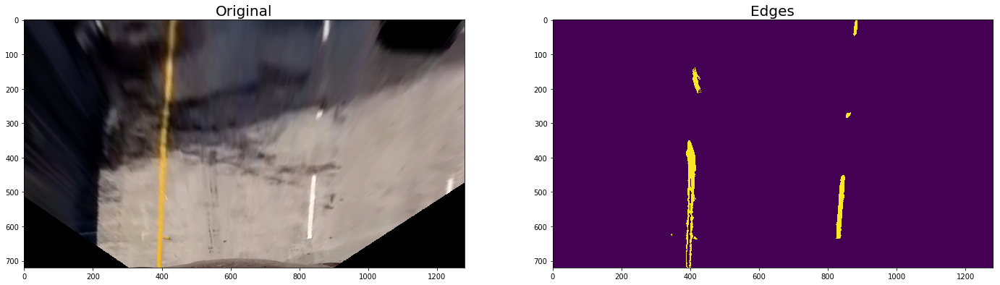

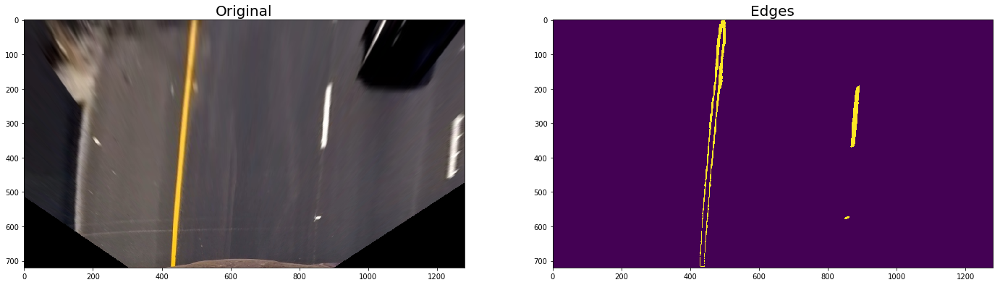

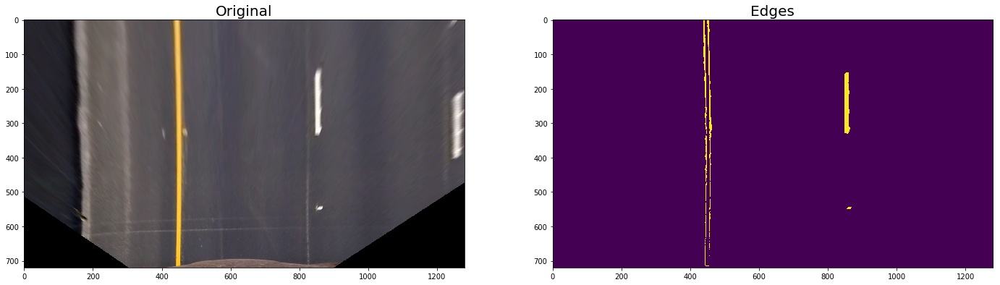

In [12]:
test_image = plt.imread('test_images/test1.jpg')
test_image = calibrated_camera(test_image)
warped_image, _ = perspective_transform(test_image)
plt.imsave('output_images/lanedetection_original.jpg', warped_image)
test_image = region_of_interest(test_image)
warped_image, _ = perspective_transform(test_image)
edges_image = extract_edges(warped_image)
plt.imsave('output_images/lanedetection_binary.jpg', edges_image)

for image in glob.glob('test_images/test*.jpg'):
    image = plt.imread(image)
    image = calibrated_camera(image)
    warped_original, _ = perspective_transform(image)
    frame_roi = region_of_interest(image)
    warped, _ = perspective_transform(frame_roi)
    edges = extract_edges(warped)

    f, (x1, x2) = plt.subplots(1, 2, figsize=(24, 9))
    
    x1.imshow(warped_original)
    x1.set_title('Original', fontsize=20)

    x2.imshow(edges)
    x2.set_title('Edges', fontsize=20)

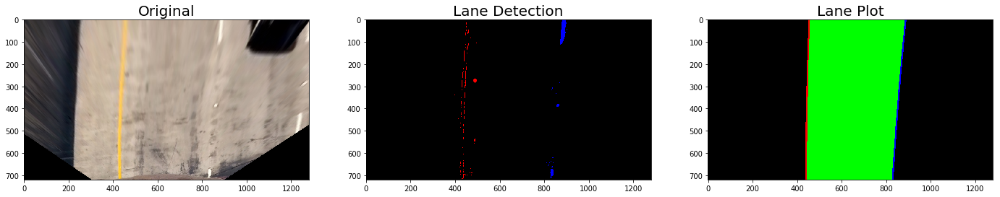

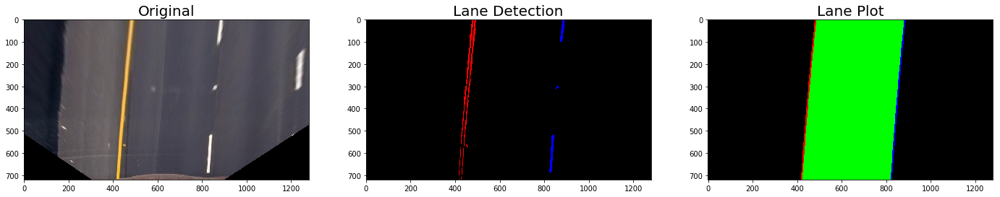

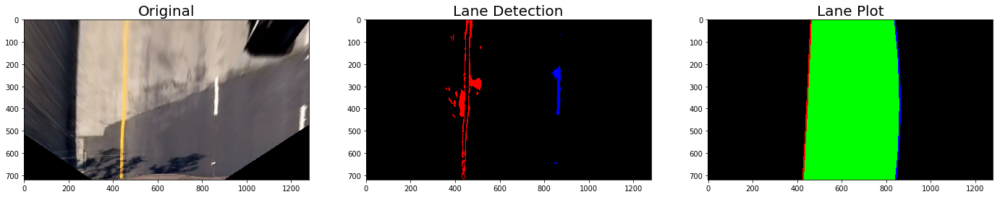

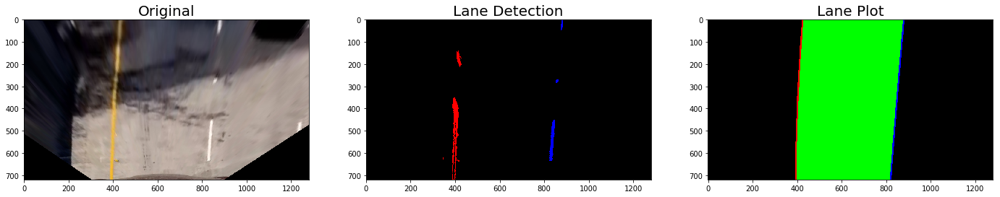

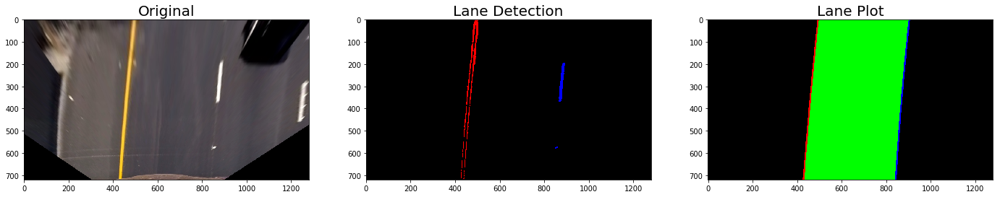

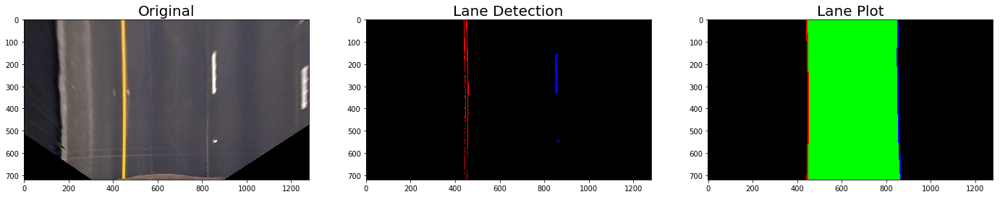

In [13]:
image = plt.imread('test_images/test1.jpg')
image = calibrated_camera(image)
image_roi = region_of_interest(image)
warped, _ = perspective_transform(image)
warped_roi, _ = perspective_transform(image_roi)
edges = extract_edges(warped_roi)
lane = LaneExtractor(edges)
left_fitx, right_fitx, ploty = lane.find_lane(edges)
leftx, lefty, rightx, righty = lane.find_lane_pixels(edges)

out_img = np.zeros_like(image)
out_img[lefty, leftx] = [255, 0, 0]
out_img[righty, rightx] = [0, 0, 255]

out_img2 = np.zeros_like(image)
for n in range(out_img2.shape[0]):
    cv2.line(out_img2, (np.int(left_fitx[n]), np.int(ploty[n])), (np.int(right_fitx[n]), np.int(ploty[n])), (0,255,0), 1)
    cv2.circle(out_img2,  (np.int(left_fitx[n]), np.int(ploty[n])), radius=2, color=(255, 0, 0), thickness=2)
    cv2.circle(out_img2, (np.int(right_fitx[n]), np.int(ploty[n])), radius=2, color=(0, 0, 255), thickness=2)

plt.imsave('output_images/lanetracing_original.jpg', warped)
plt.imsave('output_images/lanetracing_identification.jpg', out_img)
plt.imsave('output_images/lanedetection_trace.jpg', out_img2)

for image in glob.glob('test_images/test*.jpg'):
    image = plt.imread(image)
    image = calibrated_camera(image)
    image_roi = region_of_interest(image)
    warped, _ = perspective_transform(image)
    warped_roi, _ = perspective_transform(image_roi)
    edges = extract_edges(warped_roi)
    lane = LaneExtractor(edges)
    left_fitx, right_fitx, ploty = lane.find_lane(edges)
    leftx, lefty, rightx, righty = lane.find_lane_pixels(edges)
    
    out_img = np.zeros_like(image)
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    out_img2 = np.zeros_like(image)
    for n in range(out_img2.shape[0]):
        cv2.line(out_img2, (np.int(left_fitx[n]), np.int(ploty[n])), (np.int(right_fitx[n]), np.int(ploty[n])), (0,255,0), 1)
        cv2.circle(out_img2,  (np.int(left_fitx[n]), np.int(ploty[n])), radius=2, color=(255, 0, 0), thickness=2)
        cv2.circle(out_img2, (np.int(right_fitx[n]), np.int(ploty[n])), radius=2, color=(0, 0, 255), thickness=2)
    
    f, (x1, x2, x3) = plt.subplots(1, 3, figsize=(24, 9))
    
    x1.imshow(warped)
    x1.set_title('Original', fontsize=20)
    
    x2.imshow(out_img)
    x2.set_title('Lane Detection', fontsize=20)

    x3.imshow(out_img2)
    x3.set_title('Lane Plot', fontsize=20)

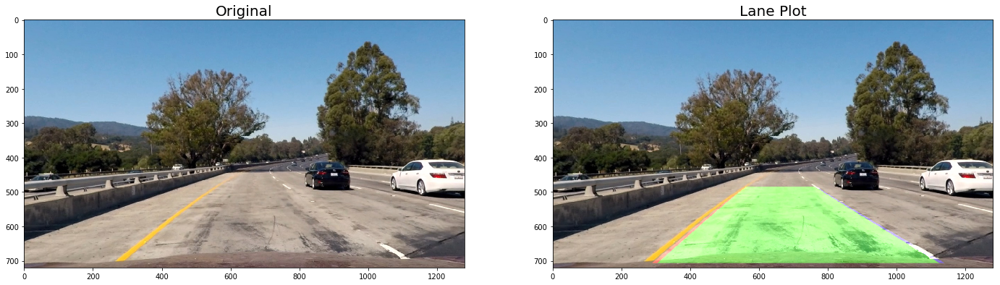

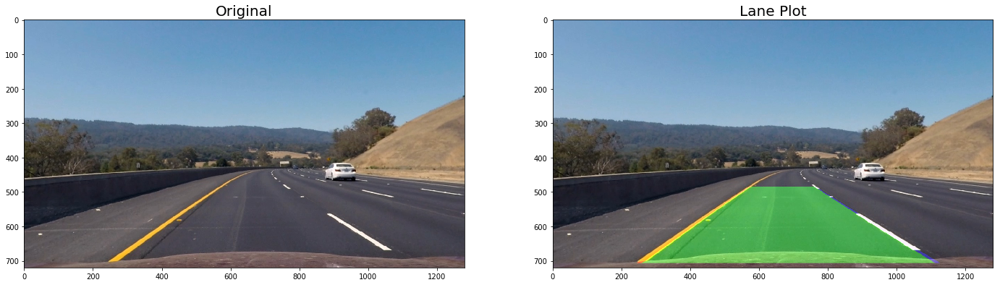

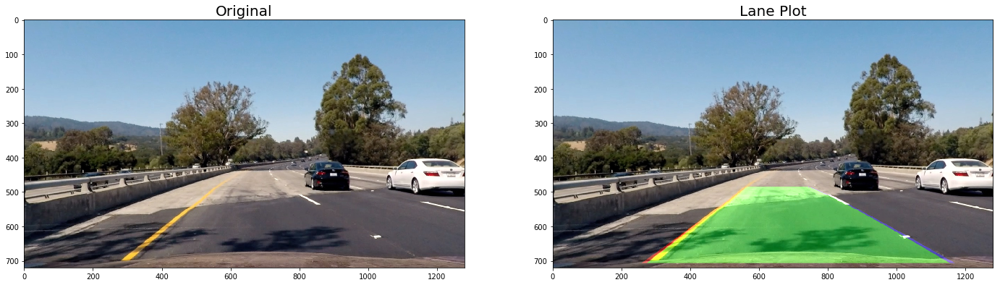

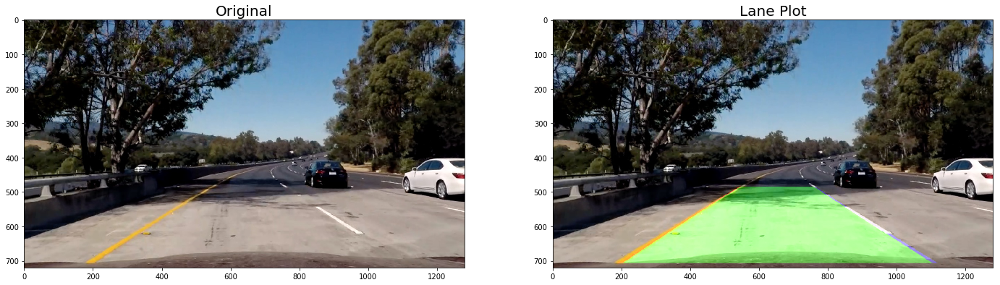

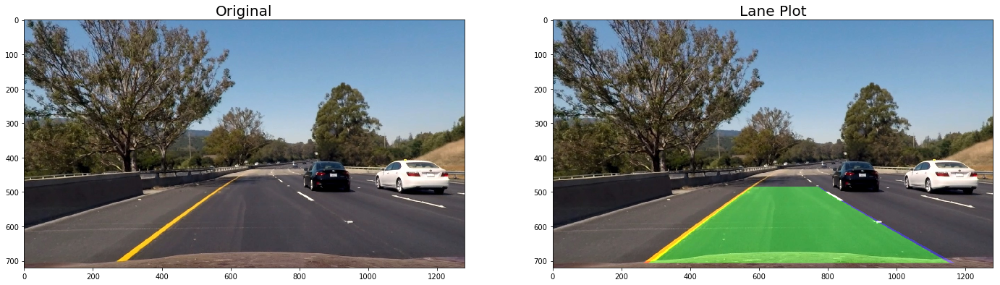

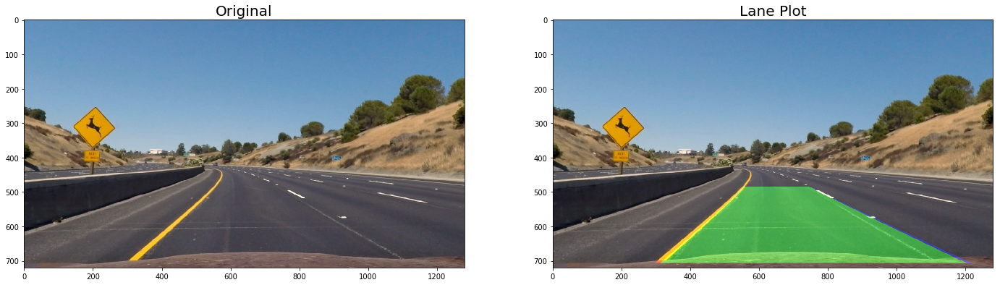

In [14]:
image = plt.imread('test_images/test1.jpg')
image = calibrated_camera(image)
image_roi = region_of_interest(image)
warped, _ = perspective_transform(image)
warped_roi, _ = perspective_transform(image_roi)
edges = extract_edges(warped_roi)
lane = LaneExtractor(edges)
left_fitx, right_fitx, ploty = lane.find_lane(edges)
leftx, lefty, rightx, righty = lane.find_lane_pixels(edges)

out_img = np.zeros_like(image)
out_img[lefty, leftx] = [255, 0, 0]
out_img[righty, rightx] = [0, 0, 255]

out_img2 = np.zeros_like(image)
for n in range(out_img2.shape[0]):
    cv2.line(out_img2, (np.int(left_fitx[n]), np.int(ploty[n])), (np.int(right_fitx[n]), np.int(ploty[n])), (0,255,0), 1)
    cv2.circle(out_img2,  (np.int(left_fitx[n]), np.int(ploty[n])), radius=2, color=(255, 0, 0), thickness=2)
    cv2.circle(out_img2, (np.int(right_fitx[n]), np.int(ploty[n])), radius=2, color=(0, 0, 255), thickness=2)

unwarped, _ = perspective_transform(out_img2.astype(np.uint8), True)
overlay = cv2.addWeighted(image, 1.0, unwarped, 0.4, 0)

plt.imsave('output_images/laneoverlay_original.jpg', image)
plt.imsave('output_images/laneoverlay_marked.jpg', overlay)

for image in glob.glob('test_images/test*.jpg'):
    image = plt.imread(image)
    image = calibrated_camera(image)
    image_roi = region_of_interest(image)
    warped, _ = perspective_transform(image)
    warped_roi, _ = perspective_transform(image_roi)
    edges = extract_edges(warped_roi)
    lane = LaneExtractor(edges)
    left_fitx, right_fitx, ploty = lane.find_lane(edges)
    leftx, lefty, rightx, righty = lane.find_lane_pixels(edges)
    
    out_img = np.zeros_like(image)
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    out_img2 = np.zeros_like(image)
    for n in range(out_img2.shape[0]):
        cv2.line(out_img2, (np.int(left_fitx[n]), np.int(ploty[n])), (np.int(right_fitx[n]), np.int(ploty[n])), (0,255,0), 1)
        cv2.circle(out_img2,  (np.int(left_fitx[n]), np.int(ploty[n])), radius=2, color=(255, 0, 0), thickness=2)
        cv2.circle(out_img2, (np.int(right_fitx[n]), np.int(ploty[n])), radius=2, color=(0, 0, 255), thickness=2)
    
    unwarped, _ = perspective_transform(out_img2.astype(np.uint8), True)
    overlay = cv2.addWeighted(image, 1.0, unwarped, 0.4, 0)
    
    f, (x1, x2) = plt.subplots(1, 2, figsize=(24, 9))
    
    x1.imshow(image)
    x1.set_title('Original', fontsize=20)

    x2.imshow(overlay)
    x2.set_title('Lane Plot', fontsize=20)

In [16]:
build_output_video('project_video')

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [04:50<00:00,  4.41it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 2min 21s, sys: 21.4 s, total: 2min 43s
Wall time: 4min 53s


In [17]:
build_output_video('challenge_video')

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [01:46<00:00,  4.64it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 53.1 s, sys: 8.41 s, total: 1min 1s
Wall time: 1min 48s


In [18]:
build_output_video('harder_challenge_video')

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [05:36<00:00,  3.36it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 2min 36s, sys: 20.6 s, total: 2min 56s
Wall time: 5min 41s


In [19]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('project_video_output.mp4'))

In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('challenge_video_output.mp4'))

In [21]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('harder_challenge_video_output.mp4'))